In [1]:
from typing import Dict, Iterable, Optional

import numpy as np
import torch
import scanpy as sc

from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
from complementary_models import HALOMASKVIR as HALOVI
from complementary_models import HALOMASKVAE as HALOVAE
import scvi
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import scipy


Global seed set to 0


In [2]:
adata_multi = sc.read_10x_mtx('./data/datasets/NEAT_Seq/outputs/RNA_ATAC/',gex_only=False)
metadata = pd.read_csv('./data/datasets/NEAT_Seq/outputs/metadata.csv',index_col = 0)
adata_multi.obs = pd.merge(adata_multi.obs, metadata, left_index=True, right_index=True)

In [3]:
adata_multi

AnnData object with n_obs × n_vars = 3841 × 117554
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm'
    var: 'gene_ids', 'feature_types'

In [4]:
adata_multi = adata_multi[adata_multi.obs.ReadsInPeaks > 4000, :]

In [5]:
sc.pp.filter_genes(adata_multi, min_cells=10)

/home/haiyi/anaconda3/envs/halo/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [6]:
adata_multi.obs["batch_id"] = 1
adata_multi.var["modality"] =adata_multi.var["feature_types"]
adata_multi.var["modality"].value_counts()
adata_mvi = scvi.data.organize_multiome_anndatas(adata_multi)
adata_mvi 

AnnData object with n_obs × n_vars = 3370 × 91583
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality'
    var: 'gene_ids', 'feature_types', 'n_cells', 'modality'

In [7]:
adata_mvi.obs['Clusters'] = adata_mvi.obs['Clusters'].astype(str).astype('category')
old_to_new = dict(
    C1='Act.',
    C2='Treg',
    C3='Th17',
    C4='Tcm',
    C5='Th2',
    C6='Th1',
    C7='Uncom.'
)
adata_mvi.obs['new_clusters'] = (
    adata_mvi.obs['Clusters']
    .map(old_to_new)
    .astype('category')
)

Cluster_color = {
                "Act.": "#D51F26",
                "Treg": "#272E6A",
                "Th17": "#208A42",
                "Tcm": "#89288F",
                "Th2": "#F47D2B",
                "Th1": "#FEE500",
                "Uncom.": "#8A9FD1"    
                }

# adata_mvi.obs['GATA3-norm'] = (adata_mvi.obs['GATA3-norm'] - adata_mvi.obs['GATA3-norm'].min()) / (adata_mvi.obs['GATA3-norm'].max() - adata_mvi.obs['GATA3-norm'].min())
adata_mvi.obs['new_clusters'].value_counts()

Tcm       1004
Th17       758
Th1        611
Uncom.     390
Th2        372
Treg       190
Act.        45
Name: new_clusters, dtype: int64

# HALO Training

In [9]:
HALOVI.setup_anndata(adata_mvi, batch_key="modality", time_key='GATA3-norm')
model = HALOVI(
    adata_mvi,
    n_genes=(adata_mvi.var['feature_types']=='Gene Expression').sum(),
    n_regions=(adata_mvi.var['feature_types']=='Peaks').sum(),
    n_layers = 2,
    n_latent = 20,
    n_dependent=10
)

n_genes :13380
n_peaks:78203
fine tune is False
gate decoder initialization n_input 20, n_output 78203,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


In [10]:
## train both RNA and ATAC
import warnings
warnings.filterwarnings("ignore")
model.module.set_finetune_params(0)
model.module.set_train_params(expr_train=True, acc_train=True)
model.train(max_epochs=1000, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1000/1000: 100%|██████████| 1000/1000 [35:38<00:00,  2.14s/it, loss=5.7e+04, v_num=1]


In [11]:
model.save("model_NEAT_seq_filtered_20LF_nocausal_epoch1000",overwrite=True)

In [12]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

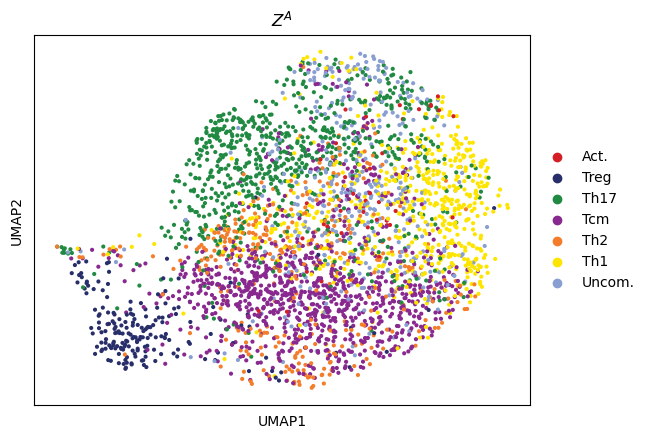

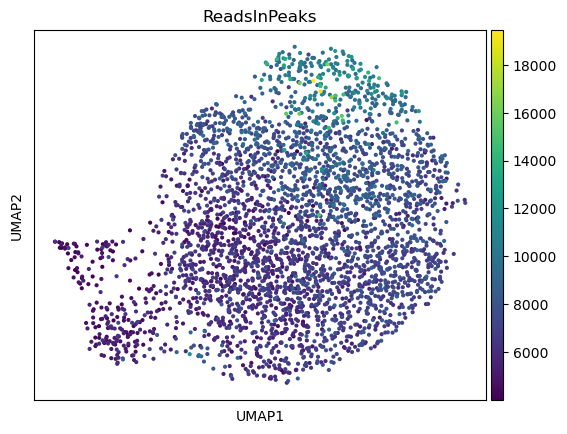

In [13]:
adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

# %matplotlib inline
# sc.pl.umap(adatssa_mvi,color='GATA3-norm',title = '$Z^{A}$',
#        vmin = 'p2', vmax= 'p98')
# plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color=['ReadsInPeaks'])
plt.show()


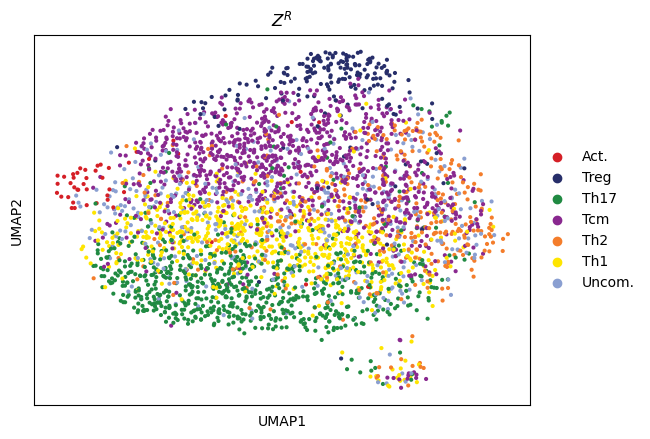

In [14]:
adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
#        vmin = 'p2', vmax= 'p98')
# plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

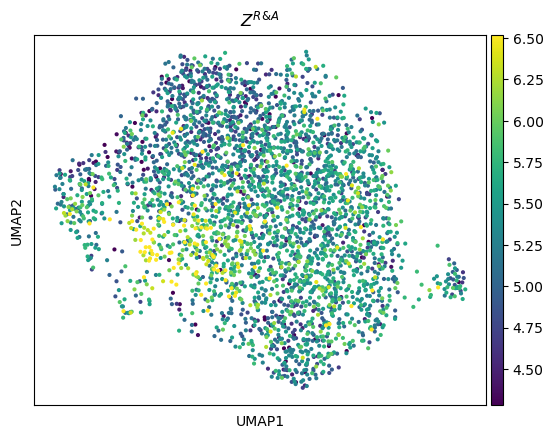

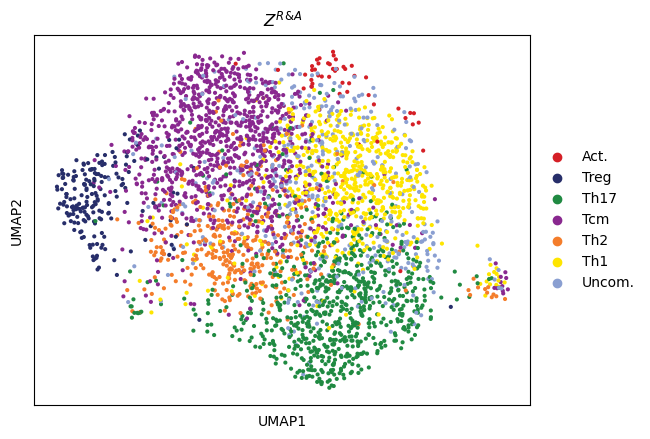

In [15]:
adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

In [16]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [18:13<00:00,  2.19s/it, loss=5.7e+04, v_num=1] 


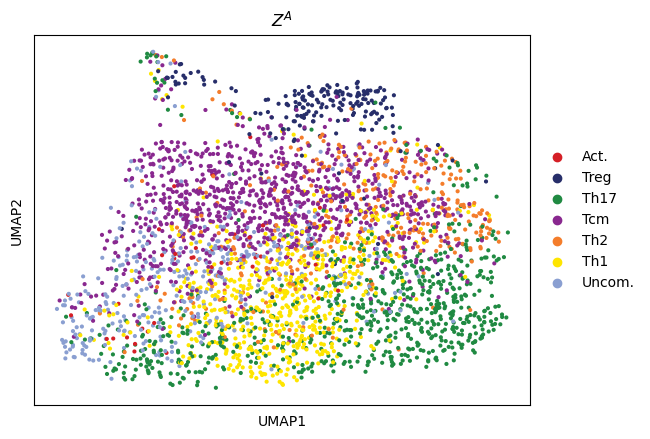

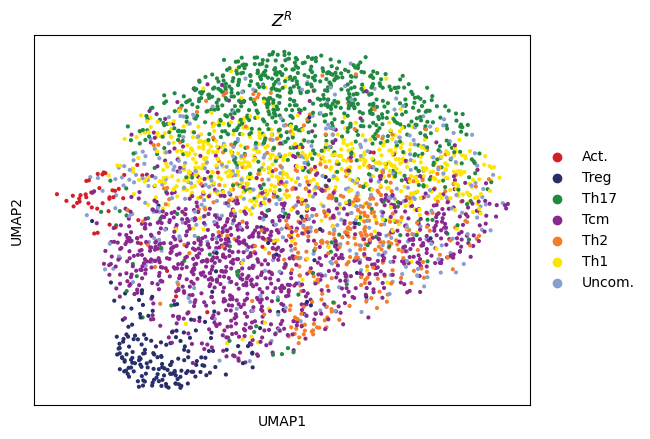

In [17]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

In [18]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [18:07<00:00,  2.17s/it, loss=5.69e+04, v_num=1]


In [19]:
model.save("model_NEAT_seq_filtered_20LF_nocausal_epoch2000",overwrite=True)

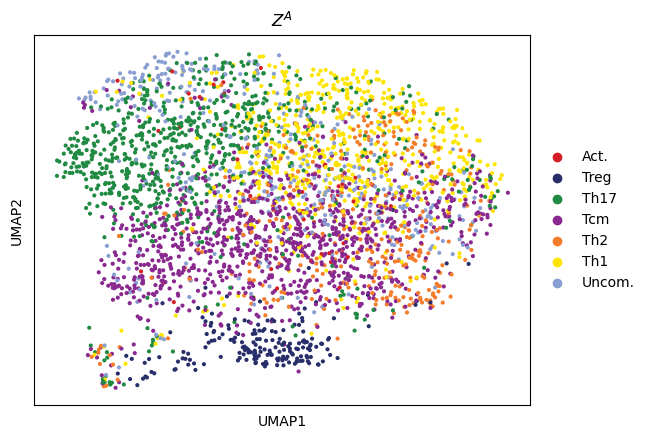

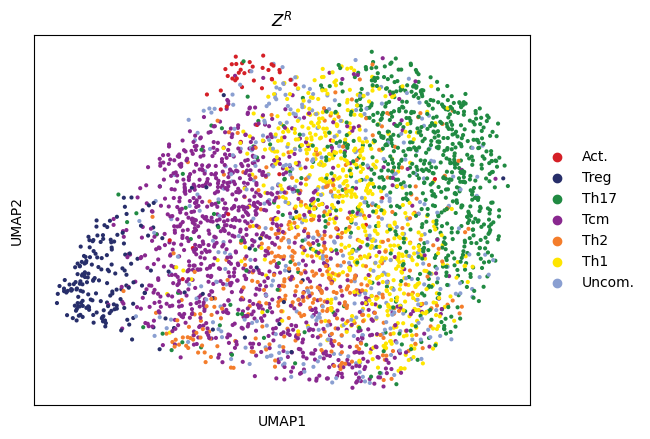

In [20]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

# Causal Constrain

In [22]:
model = model.load("model_NEAT_seq_filtered_20LF_nocausal_epoch2000",adata_mvi)

INFO     File model_NEAT_seq_filtered_20LF_nocausal_epoch2000/model.pt already downloaded    
n_genes :13380
n_peaks:78203
fine tune is False
gate decoder initialization n_input 20, n_output 78203,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


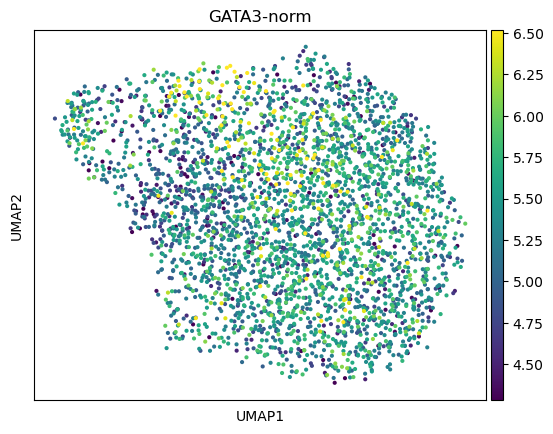

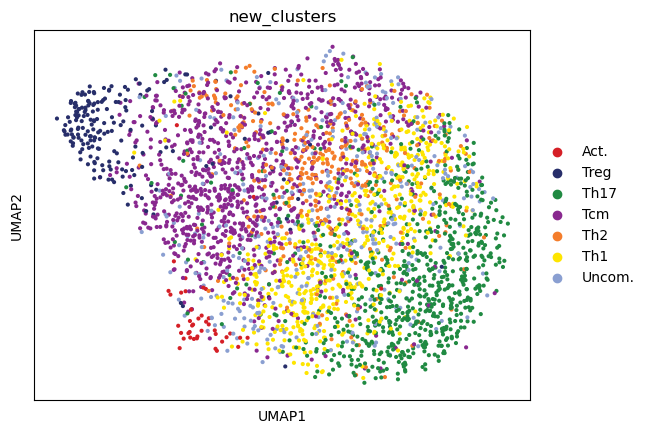

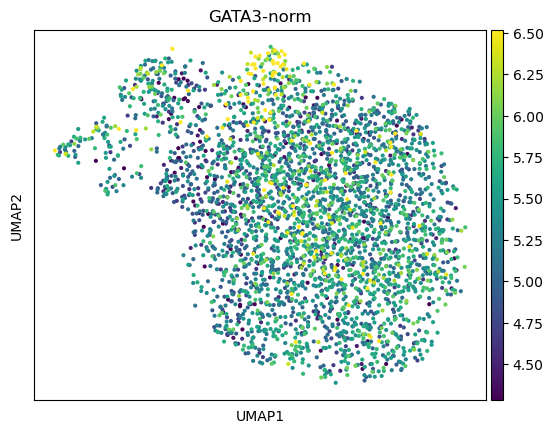

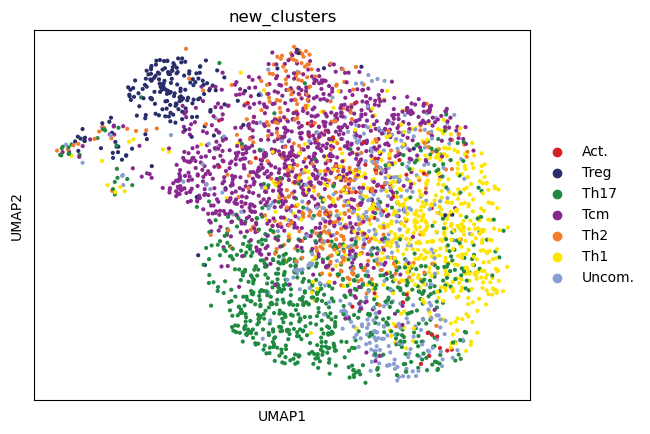

In [23]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm', vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',palette=Cluster_color)
plt.show()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm', vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',palette=Cluster_color)
plt.show()

In [24]:
model.module.alpha = 0.05
model.module.beta_2 = 1e7
model.module.beta_3 = 2e8
model.module.beta_1 = 1e7
print(model.module.alpha)

0.05


In [25]:
## finetune without L0
model.module.set_finetune_params(2)
model.module.set_train_params(expr_train=True, acc_train=True)
model.plan_kwargs = {"n_epochs_kl_warmup":300}
model.train(max_epochs=500, batch_size=512)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.64E+04, nod_loss 7.03E+04
reconst_loss 5.72E+04, nod_loss 7.99E+04
reconst_loss 5.67E+04, nod_loss 9.32E+04
reconst_loss 5.64E+04, nod_loss 8.16E+04
reconst_loss 5.77E+04, nod_loss 7.14E+04
reconst_loss 5.68E+04, nod_loss 4.31E+04
Epoch 2/500:   0%|          | 1/500 [00:02<23:52,  2.87s/it, loss=1.3e+05, v_num=1]reconst_loss 5.72E+04, nod_loss 4.84E+04
reconst_loss 5.71E+04, nod_loss 6.42E+04
reconst_loss 5.69E+04, nod_loss 8.48E+04
reconst_loss 5.67E+04, nod_loss 9.06E+04
reconst_loss 5.67E+04, nod_loss 7.84E+04
reconst_loss 5.66E+04, nod_loss 8.02E+04
Epoch 3/500:   0%|          | 2/500 [00:05<22:22,  2.70s/it, loss=1.31e+05, v_num=1]reconst_loss 5.73E+04, nod_loss 5.22E+04
reconst_loss 5.76E+04, nod_loss 6.44E+04
reconst_loss 5.66E+04, nod_loss 1.12E+05
reconst_loss 5.66E+04, nod_loss 6.54E+04
reconst_loss 5.65E+04, nod_loss 8.75E+04
reconst_loss 5.67E+04, nod_loss 7.49E+04
Epoch 4/500:   1%|          | 3/500 [00:08<

In [26]:
model.save("model_NEAT_seq_filtered_20LF_causal_alpha_0.05_epoch_500",overwrite=True)

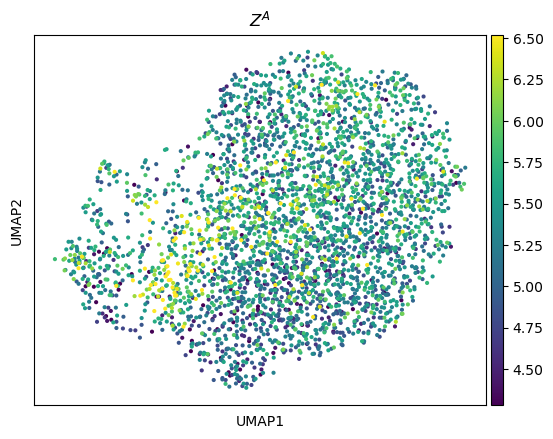

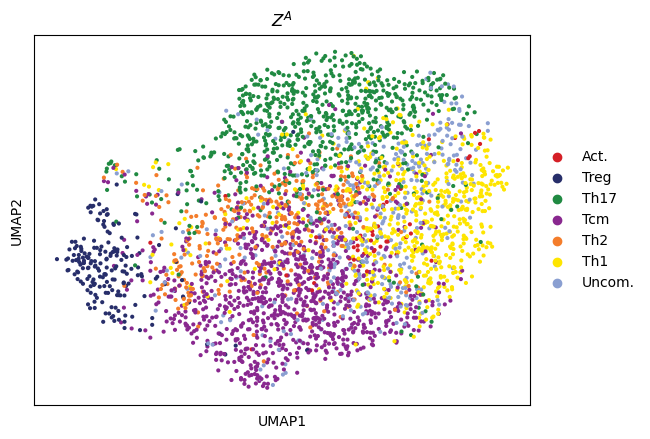

In [27]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()

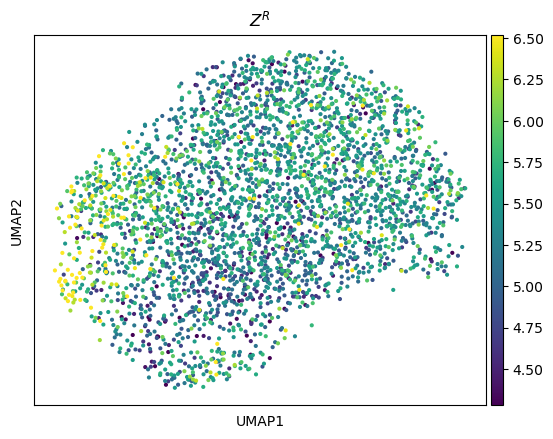

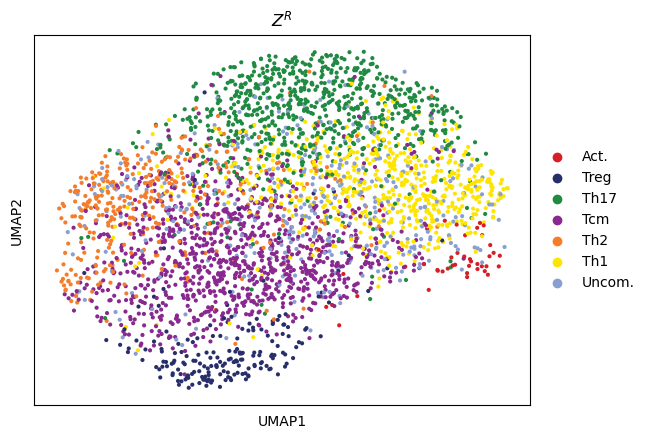

In [28]:
adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

In [29]:
model.train(max_epochs=500, batch_size=512)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.73E+04, nod_loss 7.66E+04
reconst_loss 5.67E+04, nod_loss 9.76E+04
reconst_loss 5.70E+04, nod_loss 9.08E+04
reconst_loss 5.71E+04, nod_loss 6.80E+04
reconst_loss 5.67E+04, nod_loss 4.69E+04
reconst_loss 5.65E+04, nod_loss 6.61E+04
Epoch 2/500:   0%|          | 1/500 [00:02<20:54,  2.51s/it, loss=1.31e+05, v_num=1]reconst_loss 5.74E+04, nod_loss 5.86E+04
reconst_loss 5.69E+04, nod_loss 8.19E+04
reconst_loss 5.66E+04, nod_loss 6.53E+04
reconst_loss 5.64E+04, nod_loss 8.70E+04
reconst_loss 5.64E+04, nod_loss 6.94E+04
reconst_loss 5.75E+04, nod_loss 8.01E+04
Epoch 3/500:   0%|          | 2/500 [00:05<20:49,  2.51s/it, loss=1.31e+05, v_num=1]reconst_loss 5.66E+04, nod_loss 5.26E+04
reconst_loss 5.73E+04, nod_loss 6.45E+04
reconst_loss 5.64E+04, nod_loss 7.62E+04
reconst_loss 5.67E+04, nod_loss 1.05E+05
reconst_loss 5.71E+04, nod_loss 7.85E+04
reconst_loss 5.72E+04, nod_loss 7.11E+04
Epoch 4/500:   1%|          | 3/500 [00:07

In [30]:
model.save("model_NEAT_seq_20LF_filtered_causal_alpha_0.05_epoch_1000",overwrite=True)

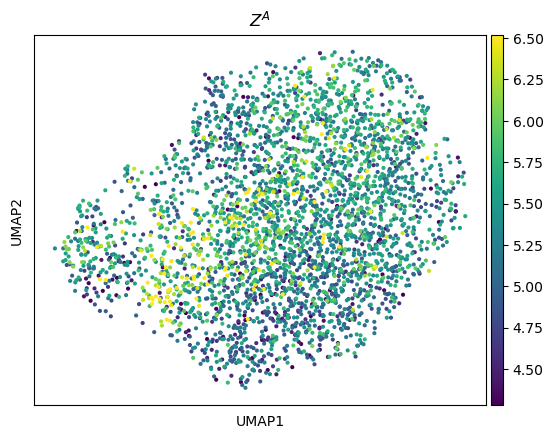

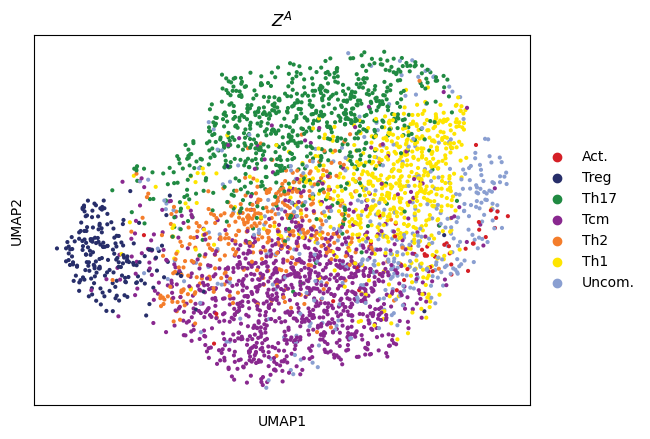

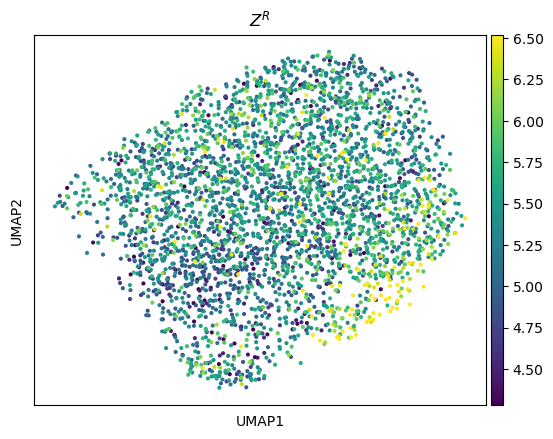

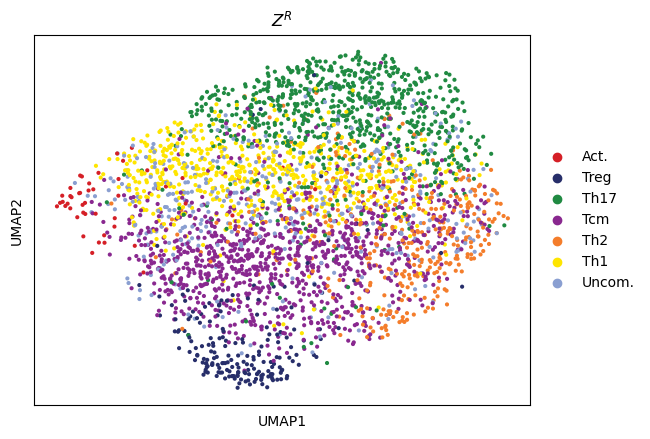

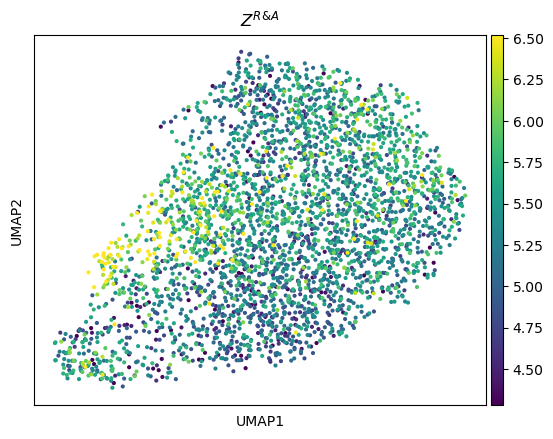

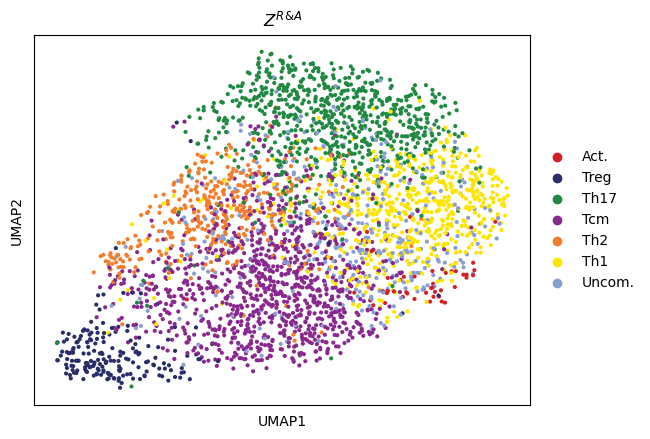

In [31]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

In [32]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.62E+04, nod_loss 1.27E+05
reconst_loss 5.73E+04, nod_loss 1.52E+05
reconst_loss 5.71E+04, nod_loss 1.52E+05
reconst_loss 5.69E+04, nod_loss 1.16E+05
reconst_loss 5.72E+04, nod_loss 1.31E+05
reconst_loss 5.64E+04, nod_loss 1.00E+05
reconst_loss 5.68E+04, nod_loss 7.75E+04
reconst_loss 5.68E+04, nod_loss 1.43E+05
reconst_loss 5.66E+04, nod_loss 1.08E+05
reconst_loss 5.68E+04, nod_loss 1.11E+05
reconst_loss 5.72E+04, nod_loss 1.32E+05
reconst_loss 5.73E+04, nod_loss 1.18E+05
Epoch 2/500:   0%|          | 1/500 [00:03<26:03,  3.13s/it, loss=1.79e+05, v_num=1]reconst_loss 5.75E+04, nod_loss 1.51E+05
reconst_loss 5.74E+04, nod_loss 1.11E+05
reconst_loss 5.63E+04, nod_loss 1.30E+05
reconst_loss 5.65E+04, nod_loss 1.07E+05
reconst_loss 5.71E+04, nod_loss 5.29E+04
reconst_loss 5.59E+04, nod_loss 1.18E+05
reconst_loss 5.64E+04, nod_loss 9.08E+04
reconst_loss 5.76E+04, nod_loss 1.37E+05
reconst_loss 5.68E+04, nod_loss 1.73E+05
rec

In [33]:
model.save("model_NEAT_seq_20LF_filtered_causal_alpha_0.05_epoch_1500",overwrite=True)

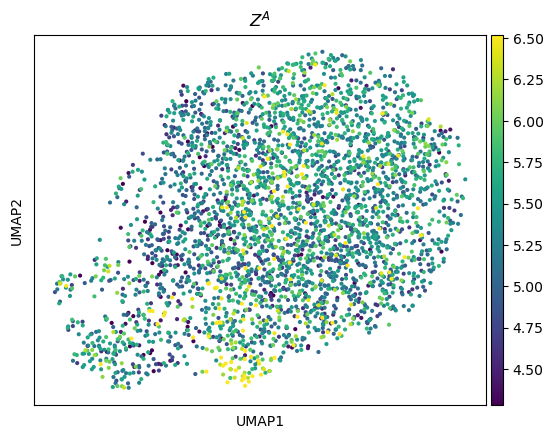

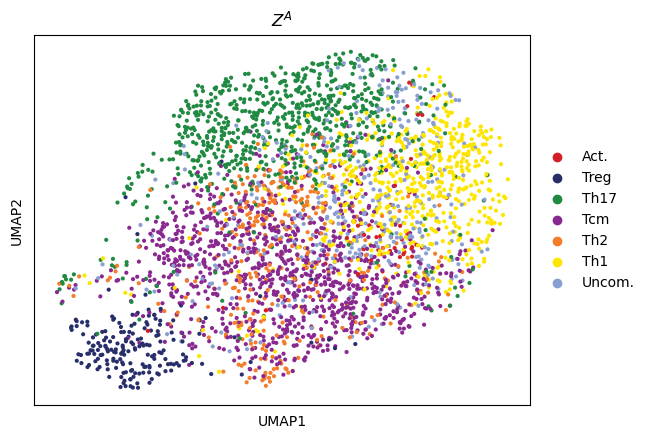

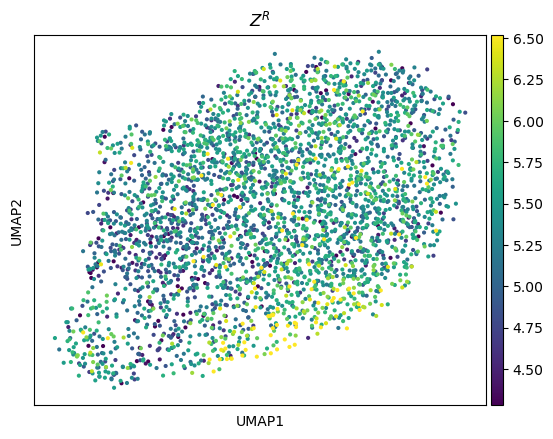

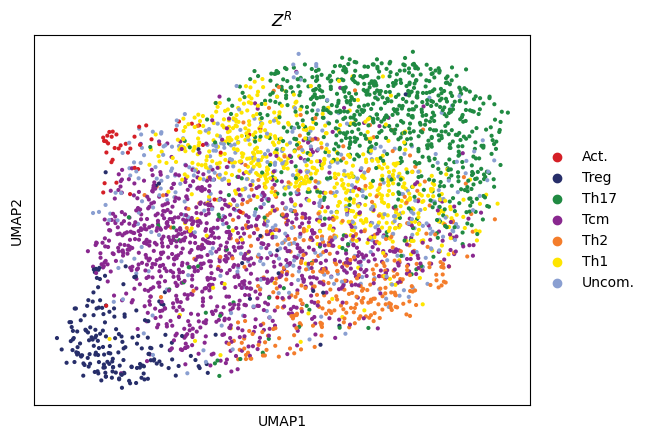

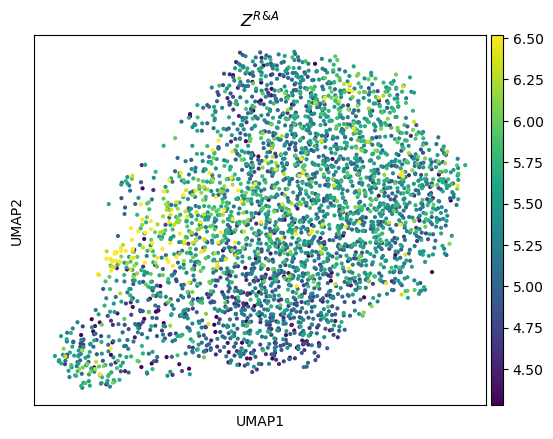

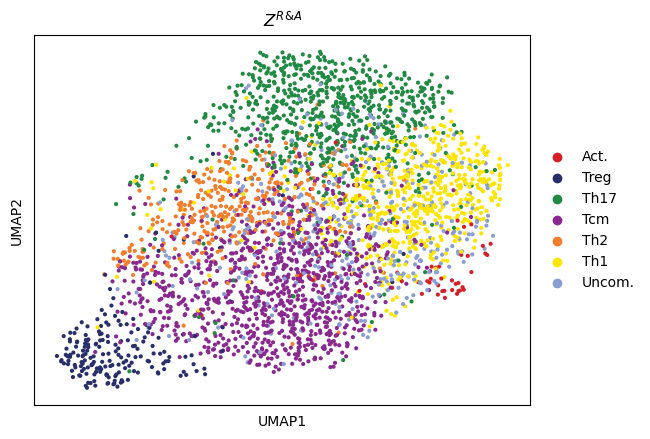

In [34]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

In [35]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.63E+04, nod_loss 1.15E+05
reconst_loss 5.61E+04, nod_loss 8.48E+04
reconst_loss 5.82E+04, nod_loss 1.89E+05
reconst_loss 5.68E+04, nod_loss 1.48E+05
reconst_loss 5.64E+04, nod_loss 1.59E+05
reconst_loss 5.67E+04, nod_loss 1.05E+05
reconst_loss 5.77E+04, nod_loss 8.53E+04
reconst_loss 5.70E+04, nod_loss 1.36E+05
reconst_loss 5.62E+04, nod_loss 1.04E+05
reconst_loss 5.76E+04, nod_loss 1.24E+05
reconst_loss 5.67E+04, nod_loss 1.14E+05
reconst_loss 5.66E+04, nod_loss 1.12E+05
Epoch 2/500:   0%|          | 1/500 [00:03<26:05,  3.14s/it, loss=1.8e+05, v_num=1]reconst_loss 5.70E+04, nod_loss 1.07E+05
reconst_loss 5.71E+04, nod_loss 1.29E+05
reconst_loss 5.62E+04, nod_loss 1.40E+05
reconst_loss 5.69E+04, nod_loss 1.44E+05
reconst_loss 5.65E+04, nod_loss 1.10E+05
reconst_loss 5.69E+04, nod_loss 1.04E+05
reconst_loss 5.73E+04, nod_loss 1.19E+05
reconst_loss 5.71E+04, nod_loss 1.21E+05
reconst_loss 5.76E+04, nod_loss 8.33E+04
reco

In [37]:
model.save("model_NEAT_seq_20LF_filtered_causal_alpha_0.05_epoch_2000",overwrite=True)

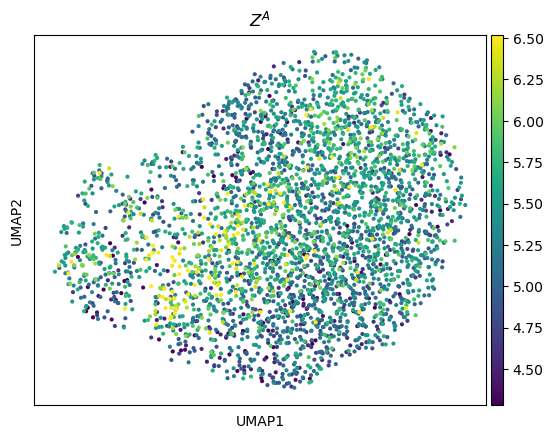

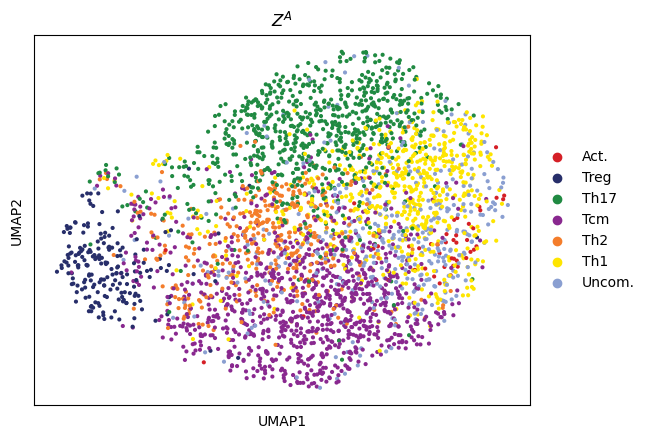

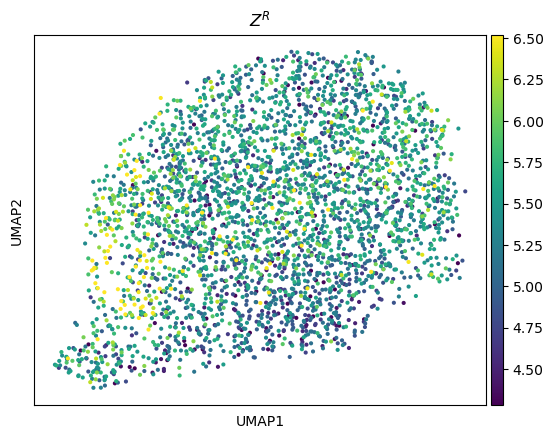

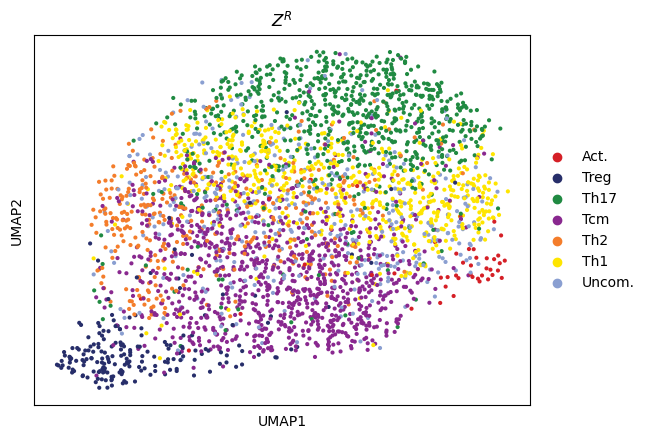

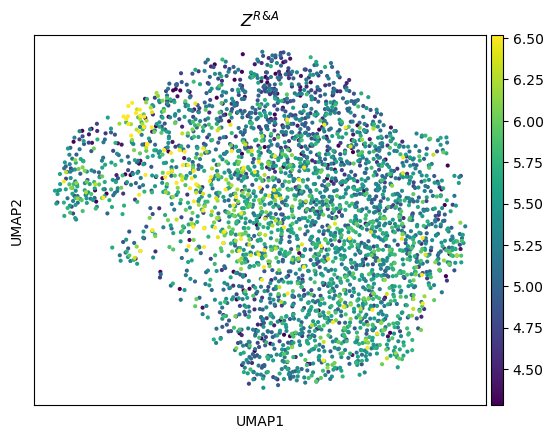

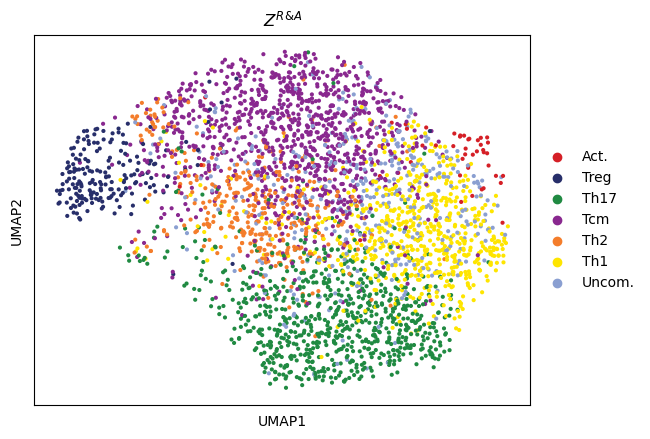

In [36]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

# load pretrain model

In [ ]:
model = model.load("model_NEAT_seq_50LF_filtered_causal_alpha_0.05_epoch_2000",adata_mvi)

In [ ]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

In [ ]:
sc.settings.vector_friendly = False

In [ ]:
# latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

# adata_mvi.obsm["latent"] = latent_acc
# sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

# sc.tl.umap(adata_mvi,min_dist =0.5)
# # sc.tl.louvain(adata_mvi)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
#        vmin = 'p2', vmax= 'p98',frameon = False,
#        save = 'NEAT_Seq_ATAC_UMAP_ADT_GATA3.pdf')
# plt.show()

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
#                 palette=Cluster_color,frameon = False,
#                 save = 'NEAT_Seq_ATAC_UMAP_celltype.pdf'
#              )
# plt.show()


# adata_mvi.obsm["latent"] = latent_expr
# sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

# sc.tl.umap(adata_mvi,min_dist =0.5)
# # sc.tl.louvain(adata_mvi)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
#        vmin = 'p2', vmax= 'p98',frameon = False,
#        save = 'NEAT_Seq_RNA_UMAP_ADT_GATA3.pdf')
# plt.show()

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
#                 palette=Cluster_color,frameon = False,
#                 save = 'NEAT_Seq_RNA_UMAP_celltype.pdf'
#              )
# plt.show()

# adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
# sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

# sc.tl.umap(adata_mvi,min_dist =0.5)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
#        vmin = 'p2', vmax= 'p98',frameon = False,
#        save = 'NEAT_Seq_multiome_UMAP_ADT_GATA3.pdf')
# plt.show()

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
#                 palette=Cluster_color,frameon = False,
#                 save = 'NEAT_Seq_multiome_UMAP_celltype.pdf'
#              )
# plt.show()

In [ ]:
from complementary_models import torch_infer_nonsta_dir

latent_atac_indep_t = torch.tensor(latent_atac_indep).to('cuda')
latent_expr_indep_t = torch.tensor(latent_expr_indep).to('cuda')
times = torch.tensor(times).to('cuda')

score3, _, _ = torch_infer_nonsta_dir(latent_atac_indep_t, latent_expr_indep_t, times)
score4, _, _ = torch_infer_nonsta_dir(latent_expr_indep_t, latent_atac_indep_t, times)
print("score3 {} and score4 {}".format(score3, score4))
score3 - score4

In [ ]:
latent_atac_dep_t = torch.tensor(latent_atac_dep).to('cuda')
latent_expr_dep_t = torch.tensor(latent_expr_dep).to('cuda')
times = torch.tensor(times).to('cuda')

score3, _, _ = torch_infer_nonsta_dir(latent_atac_dep_t, latent_expr_dep_t, times)
score4, _, _ = torch_infer_nonsta_dir(latent_expr_dep_t, latent_atac_dep_t, times)
print("score3 {} and score4 {}".format(score3, score4))
score3 - score4

In [ ]:
path2figdir = "figs/NEAT_seq/"
sc.settings.figdir =path2figdir
figure_name = "_atac+RNA"
format = ".pdf"
save_path = figure_name+format
sc.set_figure_params(vector_friendly=True)

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

sc.pl.umap(adata_mvi,color='new_clusters',title = 'ATAC+RNA',
                palette=Cluster_color,frameon = False,
                save=save_path
             )
plt.savefig(save_path, bbox_inches="tight",dpi=300)


figure_name = "_ATAC+RNA_GATA3-norm"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi,color='GATA3-norm',title = 'ATAC+RNA',
       vmin = 'p2', vmax= 'p98',frameon = False,
       save=save_path)
plt.savefig(save_path, bbox_inches="tight", dpi=300)  


In [ ]:

path2figdir = "figs/NEAT_seq/"
sc.settings.figdir =path2figdir
figure_name = "_RNA"
format = ".pdf"
save_path = figure_name+format
sc.set_figure_params(vector_friendly=True)

adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

sc.pl.umap(adata_mvi,color='new_clusters',title = 'RNA',
                palette=Cluster_color,frameon = False,
                save=save_path
             )
plt.savefig(save_path, bbox_inches="tight",dpi=300)


figure_name = "_RNA_GATA3-norm"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi,color='GATA3-norm',title = 'RNA',
       vmin = 'p2', vmax= 'p98',frameon = False,
       save=save_path)
plt.savefig(save_path, bbox_inches="tight", dpi=300)  

In [ ]:
path2figdir = "figs/NEAT_seq/"
sc.settings.figdir =path2figdir
figure_name = "_atac"
format = ".pdf"
save_path = figure_name+format
sc.set_figure_params(vector_friendly=True)

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

sc.pl.umap(adata_mvi,color='new_clusters',title = 'ATAC',
                palette=Cluster_color,frameon = False,
                save=save_path
             )
plt.savefig(save_path, bbox_inches="tight",dpi=300)


figure_name = "_ATAC_GATA3-norm"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi,color='GATA3-norm',title = 'ATAC',
       vmin = 'p2', vmax= 'p98',frameon = False,
       save=save_path)
plt.savefig(save_path, bbox_inches="tight", dpi=300)  


In [ ]:
sc.pl.umap(adata_mvi,color=['ReadsInPeaks'],frameon = False)

# visualize LF

In [ ]:
### store the latent representations, latent denoms and library size of the autoencoder models
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

# for i in range(10):
#     adata_mvi.obs["epxr_latent_"+str(i)] = min_max_scaler.fit_transform(latent_expr[:,i].reshape(1,-1))[0,:]

# for i in range(10):
#     adata_mvi.obs["atac_latent_"+str(i)] =  min_max_scaler.fit_transform(latent_acc[:,i].reshape(1,-1))[0,:]

for i in range(50):
    adata_mvi.obs["epxr_latent_"+str(i)] = latent_expr[:,i]

for i in range(50):
    adata_mvi.obs["atac_latent_"+str(i)] =  latent_acc[:,i]    

In [ ]:
latentname = ["epxr_latent_"+str(i) for i in range(50)]

In [ ]:
figure_name = "_expr_latent_3"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[3],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   

figure_name = "_expr_latent_8"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[8],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   

figure_name = "_expr_latent_20"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[20],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)  

figure_name = "_expr_latent_22"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[22],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path) 

figure_name = "_expr_latent_23"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[23],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path) 

In [ ]:
latentname = ["epxr_latent_"+str(i) for i in range(50)]

sc.pl.scatter(adata_mvi,y = 'GATA3-norm', x = latentname[3],color='new_clusters',
title = '',frameon = False,)

adata_mvi.obs['GATA3-norm'].corr(adata_mvi.obs[latentname[3]])

# correlation between GATA3-norm & EXP LF 3 = -0.34
print(scipy.stats.pearsonr(adata_mvi.obs['GATA3-norm'],adata_mvi.obs[latentname[3]]))

In [ ]:
figure_name = "_expr_latent_1_25"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[0:25],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path,
       ncols = 5)   

In [ ]:
figure_name = "_expr_latent_26_50"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[25:50],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path,
       ncols = 5)   

In [ ]:
latentname = ["atac_latent_"+str(i) for i in range(50)]

figure_name = "_atac_latent__0_24"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[1:25],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path,
       ncols = 5)   


figure_name = "_atac_latent__25_49"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[25:50],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path,
       ncols = 5)   

In [ ]:
latentname = ["atac_latent_"+str(i) for i in range(50)]

sc.pl.scatter(adata_mvi,y = 'GATA3-norm', x = latentname[3],color='new_clusters',
title = '',frameon = False,)

adata_mvi.obs['GATA3-norm'].corr(adata_mvi.obs[latentname[3]])

# correlation between GATA3-norm & EXP LF 3 = -0.34
print(scipy.stats.pearsonr(adata_mvi.obs['GATA3-norm'],adata_mvi.obs[latentname[3]]))

In [ ]:
sc.pl.scatter(adata_mvi,y = 'GATA3-norm', x = latentname[26],color='new_clusters',
title = '',frameon = False,)

# correlation between GATA3-norm & EXP LF 3 = -0.34
print(scipy.stats.pearsonr(adata_mvi.obs['GATA3-norm'],adata_mvi.obs[latentname[26]]))

In [ ]:
figure_name = "_atac_latent_3"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[3],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   


figure_name = "_atac_latent_8"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[8],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   


figure_name = "_atac_latent_20"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[20],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   


figure_name = "_atac_latent_22"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[22],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   


figure_name = "_atac_latent_23"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[23],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path) 


figure_name = "_atac_latent_26"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[26],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   


figure_name = "_atac_latent_36"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,   
       outline_width=(0.1,0), color=latentname[36],color_map = 'gnuplot',vmin='p2', vmax='p98', save=save_path)   

In [ ]:
sc.pl.scatter(adata_mvi,y = 'GATA3-norm', x = latentname[3],color='new_clusters',
title = '',frameon = False,)
adata_mvi.obs['GATA3-norm'].corr(adata_mvi.obs[latentname[3]])
print(scipy.stats.pearsonr(adata_mvi.obs['GATA3-norm'],adata_mvi.obs[latentname[3]]))

In [ ]:
rnaloading = model.get_rna_loading()
rnaloading = rnaloading.T

In [ ]:
plt.figure(figsize=(25,4))
hm = sns.heatmap(rnaloading)
hm.set(xticklabels=[]) 
hm.set(xlabel="genes")

In [ ]:
## get RNA data
from complementary_models import split_rna
rna_data = split_rna(adata_mvi=adata_mvi)

In [ ]:
rna_data.write_h5ad("./data/datasets/NEAT_Seq/outputs/rna_interim1.h5ad")

### get the highly variable genes

In [ ]:
rna_data = sc.read_h5ad("./data/datasets/NEAT_Seq/outputs/rna_interim1.h5ad")

In [ ]:
# sc.pp.filter_genes(rna_data, min_cells=15)
rna_data.raw = rna_data
## normlaize the read depths of each cell, then logarithmize the data:
sc.pp.normalize_total(rna_data, target_sum=1e4)
sc.pp.log1p(rna_data)
# Calculate highly variable genes, but with a less stringent dispersion threshold. This set of genes will be our “exogenous” genes:
sc.pp.highly_variable_genes(rna_data, min_disp = 0.2, n_top_genes=None)
rna_data.var['exog'] = rna_data.var.highly_variable.copy()
# Finally, calculate the “endogenous” geneset by intersecting the exogenous set with genes with a higher dispersion threshold:
rna_data.var['endog'] = rna_data.var.exog & (rna_data.var.dispersions_norm > 0.7)
# Restore the raw counts to the counts layer.
rna_data.layers['counts'] = rna_data.raw.to_adata().X.copy()

In [ ]:
## add the latent features of model
rna_data.obsm["X_topic_compositions"] = latent_expr

In [ ]:
for i in range(0, 50):
    print(i),
    topgenes_latent = model.get_top_genes(100, loadingmatrix=rnaloading, latent_index=i, \
    rnadata =rna_data,colname="index") # gene names are saved as the adata.var index
    name = "./data/datasets/NEAT_Seq/RNA_feature/NEAT_seq_latent_{}_genes.txt".format(str(i))
    np.savetxt(name,np.array(topgenes_latent), fmt='%s')


In [ ]:
topgenes_latent_1 = model.get_top_genes(150, loadingmatrix=rnaloading, latent_index=3, rnadata =rna_data,colname="index") # gene names are saved as the adata.var index

In [ ]:
## get post gene_list
from tools.enrichment import get_post_genelist, fetch_genelist_enrichments
post_genelist = get_post_genelist(topgenes_latent_1)
results = fetch_genelist_enrichments(post_genelist)

In [ ]:
results["results"].keys()

In [ ]:
results

In [ ]:
## plot the enrichment results
from tools.enrichment import plot_enrichments_genesets
plot_enrichments_genesets(results)

In [ ]:
def raw_umap(
            ncols = 8,
            frameon=False, 
            color_map = 'Blues', 
            add_outline = True, 
            outline_color = ('black','lightgrey'), 
            outline_width = (0, 0.5), 
            size = 30):

    return dict(
        ncols = ncols, frameon = frameon, color_map = color_map,
        add_outline = add_outline, outline_color = outline_color, 
        outline_width = outline_width, size = size
    )

In [ ]:
rna_data.obsm["X_topic_compositions"] = latent_expr
rna_data.obsm["X_umap"] = adata_mvi.obsm['X_umap']

In [ ]:
sub = rna_data.var.loc[topgenes_latent, :]
latent_genes = sub[sub.highly_variable == True].index.tolist()

In [ ]:
topgenes_latent_1[:5]



In [ ]:
sc.pl.umap(rna_data, color=['TGFB2',
     'FGF18',
     'CACNA1B',
     'NFATC1',
     'ARRB1',
     'PRKACA',
     'DUSP16'], **raw_umap(ncols=5, size=75, color_map="Blues", outline_width=(0, 0.5)),
# vmin='p1', vmax='p99', 
show=False, colorbar_loc=None) 

In [ ]:
rna_data

latentname = ["epxr_latent_"+str(i) for i in range(50)]

sc.pl.scatter(rna_data,y = 'GATA3-norm', x = 'NFATC1',color='new_clusters',
title = '',frameon = False,)


# correlation between GATA3-norm & EXP LF 3 = -0.34
# print(scipy.stats.pearsonr(adata_mvi.obs['GATA3-norm'],adata_mvi.obs[latentname[3]]))

In [ ]:
figure_name = "_RNA_latent_3_topgenes"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(rna_data, color=topgenes_latent_1, **raw_umap(ncols=5, size=75, color_map="Blues", outline_width=(0, 0.5)),
vmin='p2', vmax='p98', save=save_path,
show=False, colorbar_loc=None) 